In [16]:
from matplotlib import pyplot as plt
import pandas as pd

---
## 讀取資料

In [3]:
train = pd.read_csv("./data/sales_train_validation.csv")
calandar = pd.read_csv("./data/calendar.csv")

In [24]:
calandar['date']

0       2011-01-29
1       2011-01-30
2       2011-01-31
3       2011-02-01
4       2011-02-02
           ...    
1964    2016-06-15
1965    2016-06-16
1966    2016-06-17
1967    2016-06-18
1968    2016-06-19
Name: date, Length: 1969, dtype: object

---
## 移除跟銷售天數無關的資料

In [7]:
num_data = train.iloc[:,6:]


---
## 整體銷售量 (所有州、所有產品共同計算)

<AxesSubplot:title={'center':'Walmart overall sales'}, xlabel='date'>

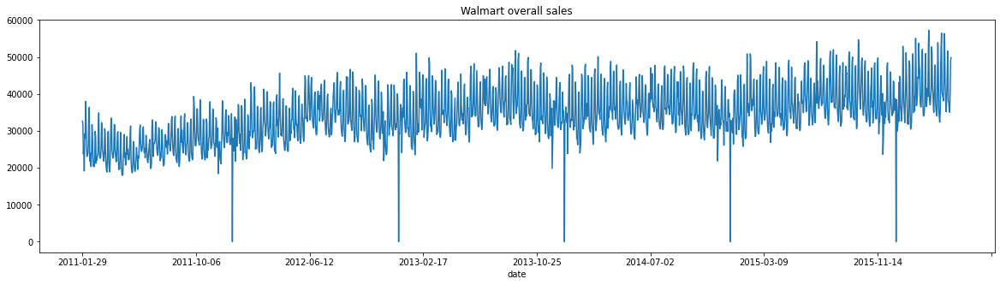

In [42]:
num_data.T.set_index(calandar['date'][:1913]).sum(axis=1).plot(figsize=(20,5), title='Walmart overall sales', xlabel='date')

---
## 各州銷售量

<AxesSubplot:title={'center':'Monthly Sales Per State'}, xlabel='date'>

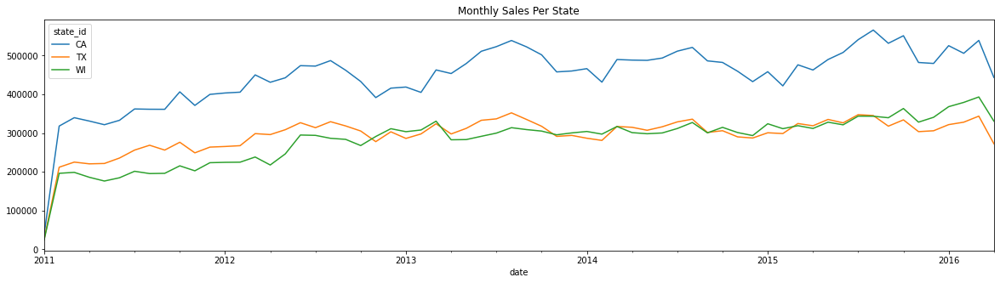

In [64]:
train.groupby('state_id').sum().T.set_index(pd.to_datetime(calandar['date'][:1913])).groupby(pd.Grouper(freq='M')).sum().plot(
    
figsize=(20,5),
    )title='Monthly Sales Per State'

---
## 各類型產品銷售量

<AxesSubplot:title={'center':'Monthly Sales Per State'}, xlabel='date'>

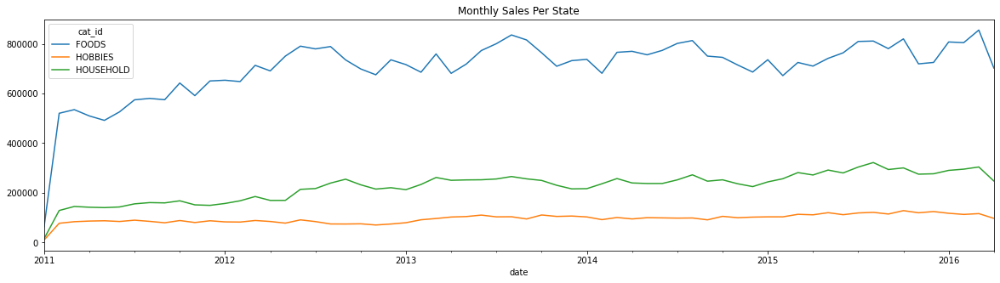

In [66]:
train.groupby('cat_id').sum().T.set_index(pd.to_datetime(calandar['date'][:1913])).groupby(pd.Grouper(freq='M')).sum().plot(
    figsize=(20,5),
    title='Monthly Sales Per State'
)

In [45]:
df = num_data.T.set_index(calandar['date'][:1913])
df

,0,1,2,3,4,5,6,7,8,9,...,30480,30481,30482,30483,30484,30485,30486,30487,30488,30489
date,,,,,,,,,,,,,,,,,,,,,
2011-01-29,0,0,0,0,0,0,0,12,2,0,...,0,14,1,0,4,0,0,0,0,0
2011-01-30,0,0,0,0,0,0,0,15,0,0,...,0,11,1,0,4,0,0,6,0,0
2011-01-31,0,0,0,0,0,0,0,0,7,1,...,0,5,1,0,2,2,0,0,0,0
2011-02-01,0,0,0,0,0,0,0,0,3,0,...,0,6,1,0,5,2,0,2,0,0
2011-02-02,0,0,0,0,0,0,0,0,0,0,...,0,5,1,0,2,0,0,2,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-20,1,1,1,0,1,0,1,4,0,0,...,4,1,1,0,0,0,0,1,1,0
2016-04-21,3,0,0,1,2,0,0,6,0,0,...,2,3,3,0,2,1,0,0,0,0
2016-04-22,0,0,1,3,2,2,0,3,0,2,...,0,1,6,0,3,0,0,0,3,0


---
## 季節性資料探索

In [69]:
from statsmodels.tsa.seasonal import seasonal_decompose

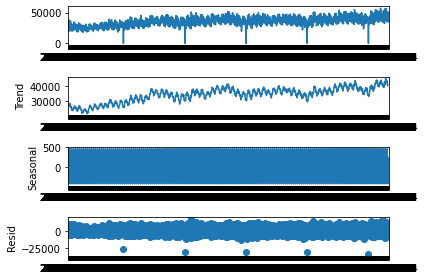

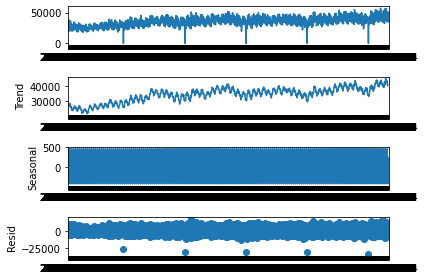

In [72]:
seasonal_decompose(df.sum(axis=1), period=12).plot()